# CAB420, Encoders and Decoders, Additional Example - Semantic Segmentation
Dr Simon Denman (s.denman@qut.edu.au)

## Overview
In this example we'll look at how encoder-decoder structures can be used for semantic segmentation. We'll build a simple network ourselves, and then make it a bit less simple.

## Too Long; Didn't Read:
* We can use an encdoer-decoder structure to map data between domains, in our case we go from an RGB image to a labelled image (semantic segmentation)
* While we can do this with a simple encoder-decoder, this may miss some fine details as we compress the spatial resolution quite heavily
* Skip connections between equivilent layers of the encoder and decoder can help recover fine details. Different networks will have different ways of sharing information between the encoder and decoder
* Like with regular classification, we can balance class weights to help prevent small class being ignored. While this may make our results look better, it may make our actual accuracy numbers look worse.

### Where does this fit with the rest of CAB420?

It's an extension of our look at auto-encoders really. Where auto-encoders try to predict the input via some complex operations, we can just as easily have our input and output being different things, i.e. we try to predict an image from some other image. A really common example of that is semantic segmentation, which is what we're doing here. You can also view this is a classification problem, where we're trying to classify every pixel in the input image.

### Why isn't this a Bonus Example?

Assignment 1B asks you to do some semantic segmentation (albeit, a bit simpler than what we have here), and students often have a go at semantic segmentation for Assignment 2. As such, I expect this to be a bit more relevent to a few more people than the bonus examples.

### Unzipping the Data

The data is provided as a zip file, ``facades.zip``. This is in the data directory, and if you unzip this file in that directory (i.e. ``unzip facades.zip``) the remainder of this script should work as-is. If you wish to put the data somewhere else, change the data paths as needed.

In [1]:
import os
os. environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

import scipy
import numpy
import glob
import matplotlib.pyplot as plt
from PIL import Image

import tensorflow as tf

import keras
from keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D, concatenate, BatchNormalization, SpatialDropout2D, Activation
from keras.models import Model
from keras import regularizers
from sklearn.model_selection import train_test_split

tf.config.optimizer.set_jit(False)

## Data Setup

We're using the building facades dataset. This contains images of the front of buildings, and a set of labels that indicates what each pixel is. A pair of example images and the segmentation map are shown below.

The data has twelve classes, which are:
* background
* facade
* window
* door
* cornice
* sill
* balcony
* blind
* deco
* molding
* pillar
* shop

There's a few things to note about this data:
* It's paired, for each input image we have a corresponding output image
* The input images have different numbers of channels. Our inputs are 3 channel (red, green, blue) while the output can be represented as a 12 channel image (1 image per class)
* Our images are all different shapes and sizes
* We also don't have many samples

The final two issues suggest data augmentation. We can use data agumentation to sample and crop images to a constant size, helping with the lack of data and standardizing our input/output. We need to create a paired augmenter, i.e. something that will augment the input and output, to do this.

### Loading the Data

Load up the data, resize, and scale the pixel values as needed. I'm also going to cleft the test data in twain, making a validation and test set.

In [2]:
data_path = '../data/facades/'

def load_files(path, target_size, scale_factor):    
    image_list = []
    filenames = glob.glob(path)
    filenames.sort()
    for filename in filenames:
        im = Image.open(filename)
        w, h = im.size
        im = im.resize((target_size, target_size))
        im=numpy.asarray(im) / scale_factor
        image_list.append(im)
    return numpy.asarray(image_list)

image_list_train = load_files(data_path + '/images/train/data/*.jpg', 128, 255.0)
mask_list_train = load_files(data_path + '/masks/train/data/*.png', 128, 1.0)
mask_list_train = numpy.reshape(mask_list_train, (numpy.shape(mask_list_train) + (1, )))
image_list_test = load_files(data_path + '/images/test/data/*.jpg', 128, 255.0)
mask_list_test = load_files(data_path + '/masks/test/data/*.png', 128, 1.0)
mask_list_test = numpy.reshape(mask_list_test, (numpy.shape(mask_list_test) + (1, )))

print(numpy.shape(image_list_train))
print(numpy.shape(mask_list_train))
print(numpy.shape(image_list_test))
print(numpy.shape(mask_list_test))

image_list_val, image_list_test, mask_list_val, mask_list_test = train_test_split(image_list_test, mask_list_test, train_size=0.5, random_state = 42)

print(numpy.shape(image_list_val))
print(numpy.shape(mask_list_val))
print(numpy.shape(image_list_test))
print(numpy.shape(mask_list_test))

(506, 128, 128, 3)
(506, 128, 128, 1)
(100, 128, 128, 3)
(100, 128, 128, 1)
(50, 128, 128, 3)
(50, 128, 128, 1)
(50, 128, 128, 3)
(50, 128, 128, 1)


We have a bunch of helper functions here. These are:
* `mask_to_categorical`: convert a mask image where each pixel has an value that indicates it's class label into a categorical image, wher each pixel is a one-hot vector. Used to create training labels.
* `categorical_to_mask`: reverse of the above, collapse a categorical image (with a one-hot vector per pixel) into a mask. Used to visualise model output
* `expand_mask_dataset`: apply `mask_to_categorical` to a whole bunch of images
* `flip_lr_augmentation`: randoml flip both images in the pair (or don't). Those who have looked at the Assignment 1B Q2 template may recognise this code.
* `random_crop_augmentation`: Apply a random crop to the image pair

You may be wondering about the augmentation functions. Why do these exist? Our input data and output data are both images, and there is a pixel-wise correspondance between them. I want to make sure that any annotation preserves this, so I've created my own annotation functions to ensure that I apply the exact same augmentation to both the input and the output.

In [3]:
num_classes = 12
def mask_to_categorical(im, num_classes):    
    one_hot_map = []
    for i in range(num_classes):
        class_map = tf.reduce_all(tf.equal(im, i+1), axis=-1)
        one_hot_map.append(class_map)
    one_hot_map = tf.stack(one_hot_map, axis=-1)
    one_hot_map = tf.cast(one_hot_map, tf.float32)    
    return one_hot_map

def categorical_to_mask(im):
    mask = tf.dtypes.cast(tf.argmax(im, axis=2), 'float32') / 255.0
    return mask

def expand_mask_dataset(data, num_classes):
    output = []
    for i in range(data.shape[0]):
        output.append(mask_to_categorical(data[i,:], num_classes))
        
    return numpy.array(output)

def flip_lr_augmentation(image, output, flip_lr_prob = 0.5):

    # randomly sample a value between 0 and 1
    uniform_sample = tf.random.uniform([], minval=0, maxval=1)
    # perform flip_lr with probability given by flip_lr_prob 
    flip_lr_cond = tf.math.less(uniform_sample, flip_lr_prob)
    # output is a tuple of (class, segmentation_mask), pull out the segmentation mask
    
    # wrapper fn for when we do the flip
    def flip():
        flipped_image = tf.image.flip_left_right(image)
        flipped_output = tf.image.flip_left_right(output)
        return flipped_image, flipped_output

    # wrapper fn for when we do NOT flip
    def no_flip():
        return image, output

    # apply augmentation    
    image, output = tf.cond(flip_lr_cond, flip, no_flip)
    # return the image, and output
    return image, output

def random_crop_augmentation(image, output, random_crop_size = (64, 64), image_size = (128, 128)):
    
    # randomly sample some cropping offsets
    x = tf.random.uniform([], minval = 0, maxval = image_size[0] - random_crop_size[0] + 1)
    y = tf.random.uniform([], minval = 0, maxval = image_size[1] - random_crop_size[1] + 1)

    cropped_image = tf.image.crop_to_bounding_box(image, int(y), int(x), int(random_crop_size[1]), int(random_crop_size[0]))
    cropped_output = mask_to_categorical(tf.image.crop_to_bounding_box(output, int(y), int(x), int(random_crop_size[1]), int(random_crop_size[0])), num_classes)
    
    return cropped_image, cropped_output

Let's get the data ready now. We'll use a tensorflow data object for the training set, and just keep the validation and testing sets as is.

I've got a couple of parameters here you may wish to tinker with, namely:
* batch_size
* image_size

The target image size is also set here, so you can scale that up if you wish to.

In [4]:
batch_size = 32
image_size = 64

# create data from already loaded tensors
training_data = tf.data.Dataset.from_tensor_slices((image_list_train, mask_list_train))
# apply left-right augmentation
training_data = training_data.map(lambda inp, out: flip_lr_augmentation(inp, out, 0.5), num_parallel_calls=tf.data.AUTOTUNE)
# apply random cropping
training_data = training_data.map(lambda inp, out: random_crop_augmentation(inp, out), num_parallel_calls=tf.data.AUTOTUNE)
# get it ready to use - shuffle and set batch size
training_data = training_data.shuffle(1000).batch(batch_size).prefetch(tf.data.AUTOTUNE)

# for the validation data, just convert the masks into a one-hot format
mask_list_val = expand_mask_dataset(mask_list_val, num_classes)
mask_list_test = expand_mask_dataset(mask_list_test, num_classes)

### Visualising the Results

Now the really important bit - we check that our data is not broken.

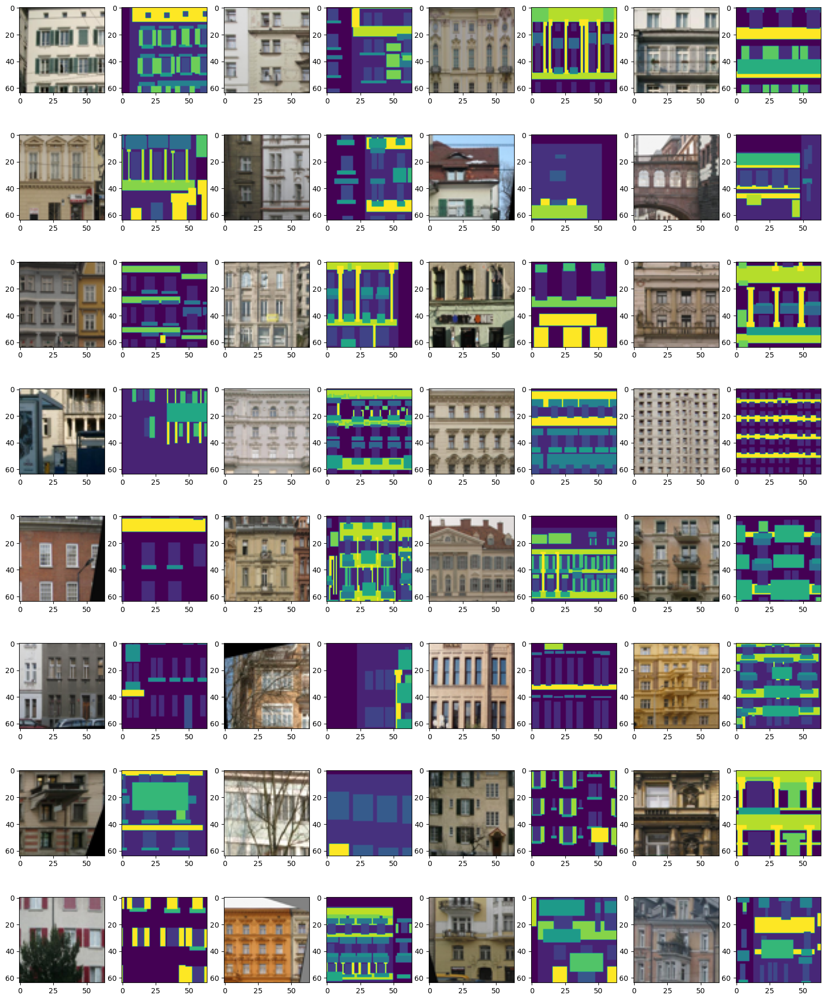

In [5]:
# training data
fig = plt.figure(figsize=[20, 25])
# sample one batch from the dataset
for image, output in training_data.take(1).as_numpy_iterator(): 
    # display image pairs
    for count in range(32):
        ax = fig.add_subplot(8, 8, count*2 + 1)
        ax.imshow(image[count, :])
        ax = fig.add_subplot(8, 8, count*2 + 2)
        ax.imshow(categorical_to_mask(output[count, :]))

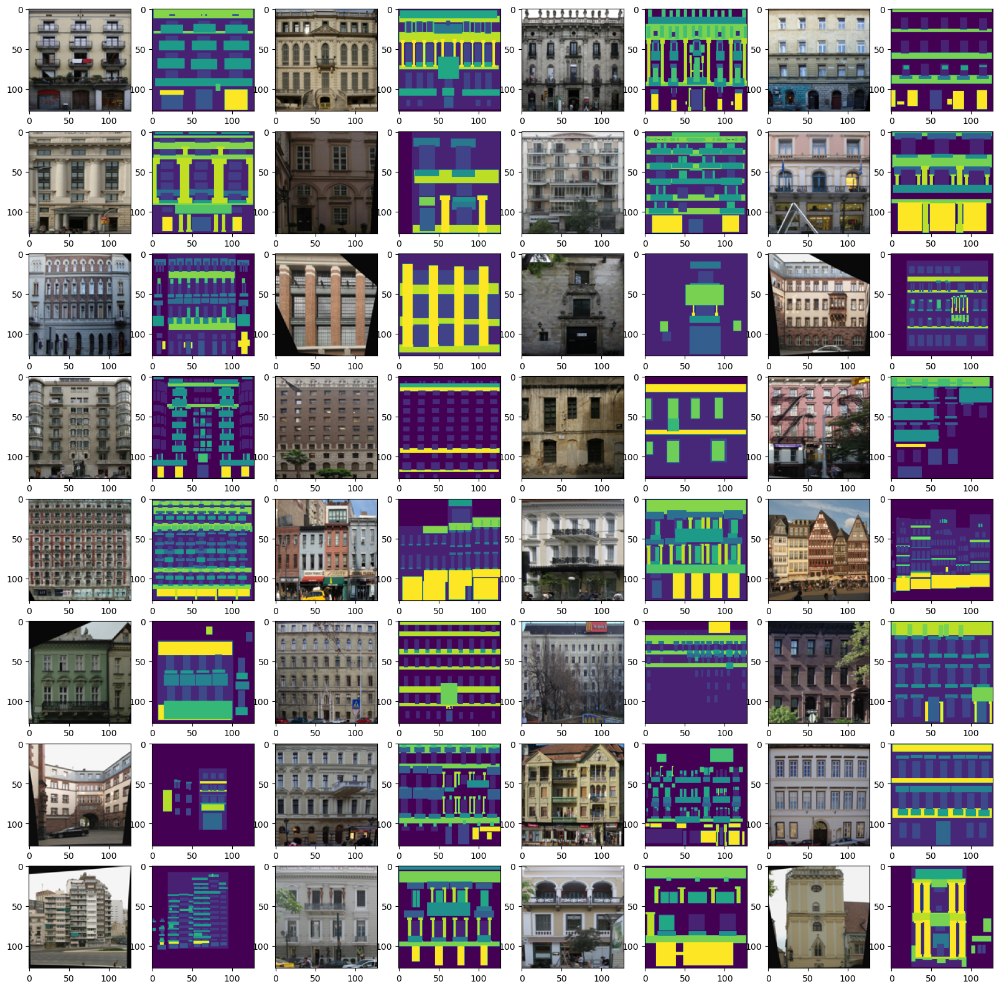

In [6]:
# test or validation data now. Just plot some imagse.
fig = plt.figure(figsize=[20, 20])
for i in range(32):
    ax = fig.add_subplot(8, 8, i*2 + 1)
    ax.imshow(image_list_val[i,:])
    ax = fig.add_subplot(8, 8, i*2 + 2)
    ax.imshow(categorical_to_mask(mask_list_val[i,:]))

They both look pretty good, and seem to be doing the right thing.

## The Network

Let's start simple, and we'll use something that looks a bit like one of our autoencoders, but with the number of filters getting bigger as we go deeper.

**WEIRDNESS ALERT!!** 
The input to this network is weird, it's `(None, None, 3)`. How can the width and height be `None` I hear you cry? What this means is that I'm not constraining these to a single size, I'm allowing the width and height to vary. This probably also seems really weird as you're perhaps thinking that isn't some network component or weight or something going to change with the image size? The network that we have here is a *fully convolutional netwwork*. We no have dense layers, so changing the width and height of our images doesn't actually impact our network parameters. Changing the number of channels in the input does, becuase this means changes the size of the convolution filters in the first convolution layer - but we've defined that as 3, so we're ok. What this will allow me to do is train the network on random $64\times 64$ crops of the training set, and then just evaluate it on the entire $128\times 128$ images, without changing anything. If I had a different size image, I could pass that through too. While this does allow me to use different size images, for efficiency it's best if during training at least I stick to just the one size image as that allows me to batch things more effectivley.

In [7]:
# input, colour images
input_img = Input(shape=(None, None, 3))

# encoder, add more filters as we go deeper
x = Conv2D(16, (3, 3), activation='relu', padding='same')(input_img)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)

# decoder, reduce filters as we go back up
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(16, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)

# output, 12 channels for 12 classes
decoded = Conv2D(12, (1, 1), activation='softmax', padding='same')(x)

segmenter = Model(input_img, decoded)
print(segmenter.summary())

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape              ┃    Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, None, None, 3)     │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d (Conv2D)                 │ (None, None, None, 16)    │        448 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, None, None, 16)    │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_1 (Conv2D)               │ (None, None, None, 32)    │      4,640 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, None, None, 32)    │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_2 (Conv2D)               │ (None, None, None, 64)    │     18,496 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, None, None, 64)    │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_3 (Conv2D)               │ (None, None, None, 64)    │     36,928 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, None, None, 64)    │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_4 (Conv2D)               │ (None, None, None, 32)    │     18,464 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, None, None, 32)    │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_5 (Conv2D)               │ (None, None, None, 16)    │      4,624 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ up_sampling2d_2 (UpSampling2D)  │ (None, None, None, 16)    │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_6 (Conv2D)               │ (None, None, None, 12)    │        204 │
└─────────────────────────────────┴───────────────────────────┴────────────┘

 Total params: 83,804 (327.36 KB)

 Trainable params: 83,804 (327.36 KB)

 Non-trainable params: 0 (0.00 B)

None


### Funky Stuff

Here's where things get interesting. In the various iterations of this example I've tweaked bits and pieces to get things training better. In particular:
* Ensuring the batch size is not too small. 32 seems to be working ok now, but previously 128 was needed for happy training
* Playing with the loss. You could use categorical cross entropy for the loss, and just apply that at each pixel (each pixel is a classification problem after all), but at some point that stopped working well. Hence, we have focal loss.

With respect to focal loss, one issue we have with this data is the imbalanced nature of it - some classes are simply more common than others. While we could look at class weights to overcome this, we can also look at loss functions that help overcome this directly. The focal loss is one such loss function, and it leads to much more consitent convergence on this data.

I've also got a learning rate schedule. This will decrease the learning rate as we train. The idea being that as we train, we'll get closer and closer to a decent solution, so can slow the learning rate as we go to avoid overshooting. We provide the scedule via a callback, which will allow `fit` to adjust the learning rate as it trains.

I've also pulled the optimiser out of the compile function to make this easier to play with and change. For completeness, we've got early stopping going on here too.

Note that I've got things like the optimiser and callbacks wrapped up in function calls to make sure that I get new instances of these everytime I run them. This is important to ensure my learning rate schedule works the way I want it to.

#### NOTE:

Time marches on, and so there are changes to keras and ensorflow. Focal loss is in-built within tensorflow these days (though not keras), and weight decay is now standard on most (all?) optimisers. I've left the code below as is, as much as anything to show that making these changes isn't hard, but it can be even easier still.

In [8]:
def focal_loss(target, output, gamma=2):
    output /= keras.ops.sum(output, axis=-1, keepdims=True)
    eps = keras.config.epsilon()
    output = keras.ops.clip(output, eps, 1. - eps)
    return -keras.ops.sum(keras.ops.power(1. - output, gamma) * target * keras.ops.log(output), axis=-1)

def scheduler(epoch, lr):
    if epoch < 10:
        return lr
    else:
        return float(lr * keras.ops.exp(-0.05))

def create_callbacks():
    scheduler_callback = keras.callbacks.LearningRateScheduler(scheduler)
    early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, verbose=0, mode='auto', restore_best_weights=True)
    return [scheduler_callback, early_stopping]

def create_optimiser():
    return keras.optimizers.Adam()

epochs = 200

Now we'll actually train the model, using what we've set up above.

In [9]:
segmenter.compile(optimizer=create_optimiser(), loss=focal_loss, jit_compile=False)
history = segmenter.fit(training_data, epochs = epochs,
                        validation_data=(image_list_val, mask_list_val), callbacks=create_callbacks(), verbose=False)

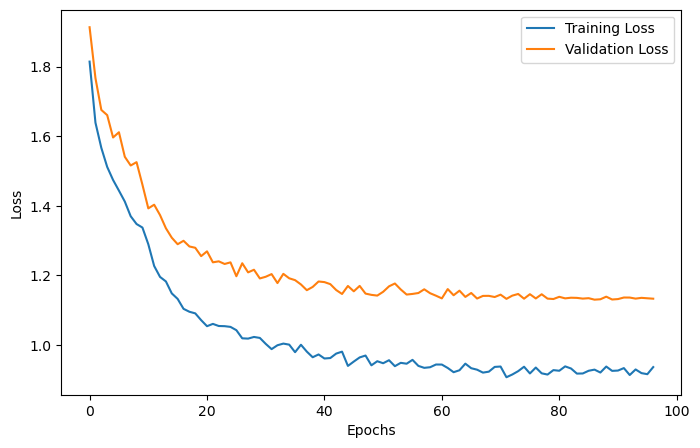

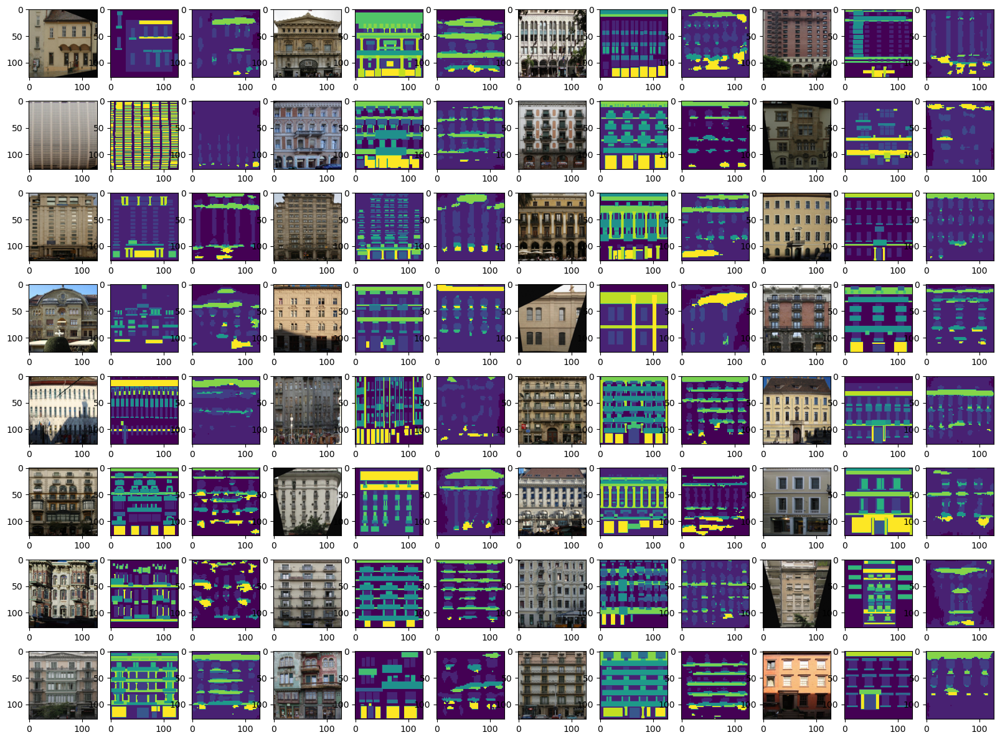

In [10]:
def plot_training(history):
    fig = plt.figure(figsize=[8, 5])
    ax = fig.add_subplot(1, 1, 1)
    ax.plot(history['loss'], label='Training Loss')
    ax.plot(history['val_loss'], label='Validation Loss')
    ax.set_xlabel('Epochs')
    ax.set_ylabel('Loss')
    ax.legend()        

def visualise(model, test_data, test_gt):
    pred = model.predict(test_data, verbose=False)
    fig = plt.figure(figsize=[20, 15])
    for i in range(32):
        ax = fig.add_subplot(8, 12, i*3 + 1)
        ax.imshow(test_data[i,:])
        ax = fig.add_subplot(8, 12, i*3 + 2)
        ax.imshow(categorical_to_mask(test_gt[i,:]))
        ax = fig.add_subplot(8, 12, i*3 + 3)
        ax.imshow(categorical_to_mask(pred[i,:]))  
      
plot_training(history.history)
visualise(segmenter, image_list_test, mask_list_test)

We see our model works OK. It actually does ok for all classes here, even the rarer ones, due to the Focal Loss.

## A Better Model

Let's scale it up. This is not really any more fancy that what we had just before, but is rather preperation for what's to come. As usual, our method of scaling is to add more convolution layers.

In [11]:
# input image
input_img = Input(shape=(None, None, 3))

# encoder, similar to last time, but with pairs of convolutions
x = Conv2D(16, (3, 3), activation='relu', padding='same')(input_img)
x = Conv2D(16, (3, 3), activation='relu', padding='same')(input_img)
x = MaxPooling2D((2, 2), padding='same')(x)

x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)

x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)

# middle of the model, we're adding a couple of layers here where we'll hope to extract 
# semantic info that captures important details
x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)

# decoder, similar to last time, but again with pairs of convolutions
x = UpSampling2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)

x = UpSampling2D((2, 2))(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)

x = UpSampling2D((2, 2))(x)
x = Conv2D(16, (3, 3), activation='relu', padding='same')(x)
x = Conv2D(16, (3, 3), activation='relu', padding='same')(x)

# output, again, 12 channels, so 12 filters
decoded = Conv2D(12, (1, 1), activation='softmax', padding='same')(x)

segmenter = Model(input_img, decoded)
print(segmenter.summary())

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape              ┃    Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, None, None, 3)     │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_8 (Conv2D)               │ (None, None, None, 16)    │        448 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, None, None, 16)    │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_9 (Conv2D)               │ (None, None, None, 32)    │      4,640 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_10 (Conv2D)              │ (None, None, None, 32)    │      9,248 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, None, None, 32)    │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_11 (Conv2D)              │ (None, None, None, 64)    │     18,496 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_12 (Conv2D)              │ (None, None, None, 64)    │     36,928 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, None, None, 64)    │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_13 (Conv2D)              │ (None, None, None, 128)   │     73,856 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_14 (Conv2D)              │ (None, None, None, 128)   │    147,584 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ up_sampling2d_3 (UpSampling2D)  │ (None, None, None, 128)   │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_15 (Conv2D)              │ (None, None, None, 64)    │     73,792 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_16 (Conv2D)              │ (None, None, None, 64)    │     36,928 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ up_sampling2d_4 (UpSampling2D)  │ (None, None, None, 64)    │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_17 (Conv2D)              │ (None, None, None, 32)    │     18,464 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_18 (Conv2D)              │ (None, None, None, 32)    │      9,248 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ up_sampling2d_5 (UpSampling2D)  │ (None, None, None, 32)    │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_19 (Conv2D)              │ (None, None, None, 16)    │      4,624 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_20 (Conv2D)              │ (None, None, None, 16)    │      2,320 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_21 (Conv2D)              │ (None, None, None, 12)    │        204 │
└─────────────────────────────────┴───────────────────────────┴────────────┘

 Total params: 436,780 (1.67 MB)

 Trainable params: 436,780 (1.67 MB)

 Non-trainable params: 0 (0.00 B)

None


In [12]:
segmenter.compile(optimizer=create_optimiser(), loss=focal_loss, jit_compile=False)
history = segmenter.fit(training_data, epochs = epochs,
                        validation_data=(image_list_val, mask_list_val), callbacks=create_callbacks(), verbose=False)

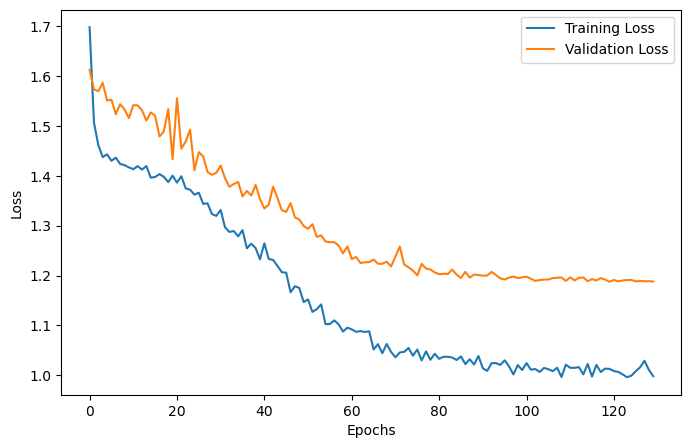

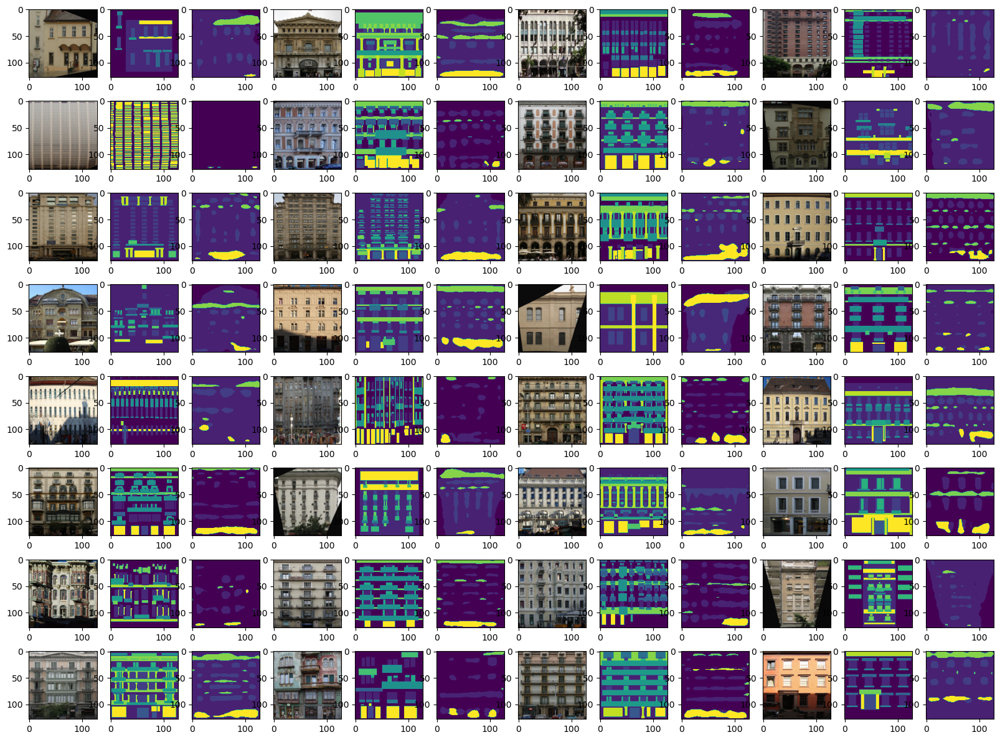

In [13]:
plot_training(history.history)
visualise(segmenter, image_list_test, mask_list_test)

This looks pretty similar to what we had before, and the overall loss we finish with is similar too. 

One of the issues that we do have is that we lose a lot of spatial detail. If we consider our above model we go from:
* a 64x64 input, to
* an 8x8 representation in the middle of the model, to
* a 64x64 output

It's hard to have the model recover all that spatial detail as it goes back up to the output size. Let's solve that.

## U-Net

What we need is a way to retain some of the spatial info. Enter U-Net and skip connections. Basically what we're going to do is take convolution features from directly before pooling as we go down through the encoder, and stack these with the interpolated features straight after the upsampling as we go up the decoder. This way we get features from the original spatial resolution mixed in with those that have been all the way through the network. 

This helps retain spatial information as we now get features that haven't been subject to very high levels of spatial compression into the decoder, and also allows us to use the skip connections to help train the network.

In [14]:
input_img = Input(shape=(None, None, 3))

conv1 = Conv2D(16, (3, 3), activation='relu', padding='same')(input_img)
conv1 = Conv2D(16, (3, 3), activation='relu', padding='same')(conv1)
pool1 = MaxPooling2D((2, 2), padding='same')(conv1)

conv2 = Conv2D(32, (3, 3), activation='relu', padding='same')(pool1)
conv2 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv2)
pool2 = MaxPooling2D((2, 2), padding='same')(conv2)

conv3 = Conv2D(64, (3, 3), activation='relu', padding='same')(pool2)
conv3 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv3)
pool3 = MaxPooling2D((2, 2), padding='same')(conv3)

conv4 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool3)
conv4 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv4)

up1 = UpSampling2D((2, 2))(conv4)
merge1 = concatenate([conv3,up1], axis = 3)
conv5 = Conv2D(64, (3, 3), activation='relu', padding='same')(merge1)
conv5 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv5)

up2 = UpSampling2D((2, 2))(conv5)
merge2 = concatenate([conv2,up2], axis = 3)
conv6 = Conv2D(32, (3, 3), activation='relu', padding='same')(merge2)
conv6 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv6)

up3 = UpSampling2D((2, 2))(conv6)
merge3 = concatenate([conv1,up3], axis = 3)
conv7 = Conv2D(16, (3, 3), activation='relu', padding='same')(merge3)
conv7 = Conv2D(16, (3, 3), activation='relu', padding='same')(conv7)
decoded = Conv2D(12, (1, 1), activation='softmax', padding='same')(conv7)

segmenter = Model(input_img, decoded)
print(segmenter.summary())

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃ Param # ┃ Connected to         ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, None,      │       0 │ -                    │
│ (InputLayer)        │ None, 3)          │         │                      │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ conv2d_22 (Conv2D)  │ (None, None,      │     448 │ input_layer_2[0][0]  │
│                     │ None, 16)         │         │                      │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ conv2d_23 (Conv2D)  │ (None, None,      │   2,320 │ conv2d_22[0][0]      │
│                     │ None, 16)         │         │                      │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ max_pooling2d_6     │ (None, None,      │       0 │ conv2d_23[0][0]      │
│ (MaxPooling2D)      │ None, 16)         │         │                      │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ conv2d_24 (Conv2D)  │ (None, None,      │   4,640 │ max_pooling2d_6[0][… │
│                     │ None, 32)         │         │                      │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ conv2d_25 (Conv2D)  │ (None, None,      │   9,248 │ conv2d_24[0][0]      │
│                     │ None, 32)         │         │                      │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ max_pooling2d_7     │ (None, None,      │       0 │ conv2d_25[0][0]      │
│ (MaxPooling2D)      │ None, 32)         │         │                      │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ conv2d_26 (Conv2D)  │ (None, None,      │  18,496 │ max_pooling2d_7[0][… │
│                     │ None, 64)         │         │                      │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ conv2d_27 (Conv2D)  │ (None, None,      │  36,928 │ conv2d_26[0][0]      │
│                     │ None, 64)         │         │                      │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ max_pooling2d_8     │ (None, None,      │       0 │ conv2d_27[0][0]      │
│ (MaxPooling2D)      │ None, 64)         │         │                      │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ conv2d_28 (Conv2D)  │ (None, None,      │  73,856 │ max_pooling2d_8[0][… │
│                     │ None, 128)        │         │                      │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ conv2d_29 (Conv2D)  │ (None, None,      │ 147,584 │ conv2d_28[0][0]      │
│                     │ None, 128)        │         │                      │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ up_sampling2d_6     │ (None, None,      │       0 │ conv2d_29[0][0]      │
│ (UpSampling2D)      │ None, 128)        │         │                      │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ concatenate         │ (None, None,      │       0 │ conv2d_27[0][0],     │
│ (Concatenate)       │ None, 192)        │         │ up_sampling2d_6[0][… │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ conv2d_30 (Conv2D)  │ (None, None,      │ 110,656 │ concatenate[0][0]    │
│                     │ None, 64)         │         │                      │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ conv2d_31 (Conv2D)  │ (None, None,      │  36,928 │ conv2d_30[0][0]      │
│                     │ None, 64)         │         │                      │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ up_sampling2d_7     │ (None, None,      │       0 │ conv2d_31[0][0]    

 Total params: 487,484 (1.86 MB)

 Trainable params: 487,484 (1.86 MB)

 Non-trainable params: 0 (0.00 B)

None


In [15]:
segmenter.compile(optimizer=create_optimiser(), loss=focal_loss, jit_compile=False)
history = segmenter.fit(training_data, epochs = epochs,
                        validation_data=(image_list_val, mask_list_val), callbacks=create_callbacks(), verbose=False)

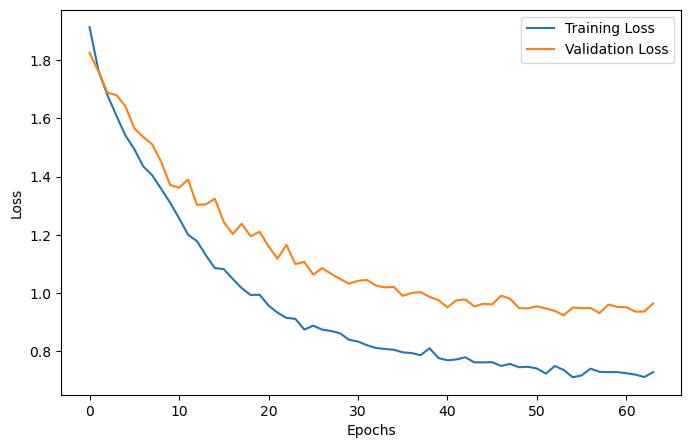

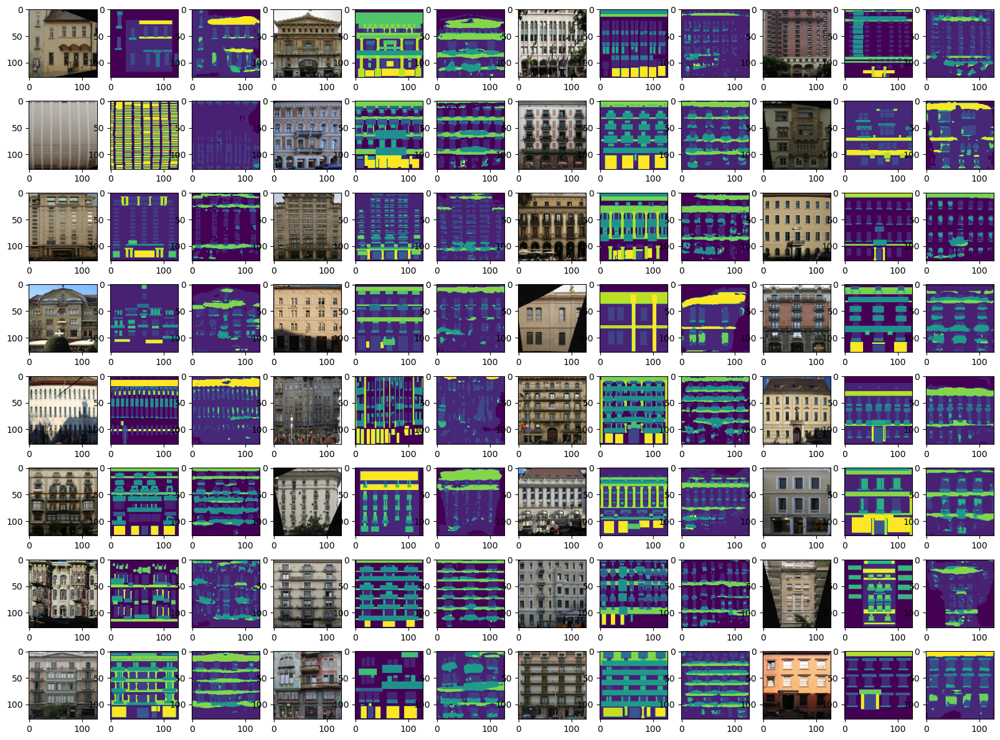

In [16]:
plot_training(history.history)
visualise(segmenter, image_list_test, mask_list_test)

We've still got plenty of errors in there, but to my eyes at least we have more of the fine details being pulled out. 

One interesting thing to note is the training speed. This model converges to the same loss as out above networks, but in many fewer epochs. This is in part down to our skip connectsions, which allow gradients to flow more easily back to the early layers of the network.

## What About BatchNorm?

We've used BatchNorm a lot prior to this. Why is it not here?

The short answer is that the original U-Net paper didn't incude it, so I've left it out, but we can add it in, in the same sort of place that we'd usually do. For me, this does however raise one issue: during our concatenation, we concatenate features from after the batchNorm in the down-stream (the encoder, i.e. conv1) with features from after the batchNorm in the up-stream (the decoder, i.e. up3). These two batchNorm's (for conv1 and up3) are different, and so may be (probably are) normalised into different ranges. For this reason, I've just got my batch norms in the encoder. I've also only got two, as I found more made training a bit unreliable (though increasing the batch size may well counter that). 

In [17]:
input_img = Input(shape=(None, None, 3))

conv1 = Conv2D(16, (3, 3), activation='relu', padding='same')(input_img)
conv1 = Conv2D(16, (3, 3), activation=None, padding='same')(conv1)
conv1 = SpatialDropout2D(0.2)(conv1)
conv1 = Activation('relu')(conv1)
pool1 = MaxPooling2D((2, 2), padding='same')(conv1)

conv2 = Conv2D(32, (3, 3), activation='relu', padding='same')(pool1)
conv2 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv2)
conv2 = BatchNormalization()(conv2)
conv2 = SpatialDropout2D(0.2)(conv2)
conv2 = Activation('relu')(conv2)
pool2 = MaxPooling2D((2, 2), padding='same')(conv2)

conv3 = Conv2D(64, (3, 3), activation='relu', padding='same')(pool2)
conv3 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv3)
conv3 = SpatialDropout2D(0.2)(conv3)
conv3 = Activation('relu')(conv3)
pool3 = MaxPooling2D((2, 2), padding='same')(conv3)

conv4 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool3)
conv4 = Conv2D(128, (3, 3), activation=None, padding='same')(conv4)
conv4 = BatchNormalization()(conv4)
conv4 = SpatialDropout2D(0.2)(conv4)
conv4 = Activation('relu')(conv4)

up1 = UpSampling2D((2, 2))(conv4)
merge1 = concatenate([conv3,up1], axis = 3)
conv5 = Conv2D(64, (3, 3), activation='relu', padding='same')(merge1)
conv5 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv5)
conv5 = SpatialDropout2D(0.2)(conv5)
conv5 = Activation('relu')(conv5)

up2 = UpSampling2D((2, 2))(conv5)
merge2 = concatenate([conv2,up2], axis = 3)
conv6 = Conv2D(32, (3, 3), activation='relu', padding='same')(merge2)
conv6 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv6)
conv6 = SpatialDropout2D(0.2)(conv6)
conv6 = Activation('relu')(conv6)

up3 = UpSampling2D((2, 2))(conv6)
merge3 = concatenate([conv1,up3], axis = 3)
conv7 = Conv2D(16, (3, 3), activation='relu', padding='same')(merge3)
conv7 = Conv2D(16, (3, 3), activation='relu', padding='same')(conv7)
conv7 = SpatialDropout2D(0.2)(conv7)
conv7 = Activation('relu')(conv7)

decoded = Conv2D(12, (1, 1), activation='softmax', padding='same')(conv7)

segmenter = Model(input_img, decoded)
print(segmenter.summary())

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃ Param # ┃ Connected to         ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, None,      │       0 │ -                    │
│ (InputLayer)        │ None, 3)          │         │                      │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ conv2d_37 (Conv2D)  │ (None, None,      │     448 │ input_layer_3[0][0]  │
│                     │ None, 16)         │         │                      │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ conv2d_38 (Conv2D)  │ (None, None,      │   2,320 │ conv2d_37[0][0]      │
│                     │ None, 16)         │         │                      │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ spatial_dropout2d   │ (None, None,      │       0 │ conv2d_38[0][0]      │
│ (SpatialDropout2D)  │ None, 16)         │         │                      │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ activation          │ (None, None,      │       0 │ spatial_dropout2d[0… │
│ (Activation)        │ None, 16)         │         │                      │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ max_pooling2d_9     │ (None, None,      │       0 │ activation[0][0]     │
│ (MaxPooling2D)      │ None, 16)         │         │                      │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ conv2d_39 (Conv2D)  │ (None, None,      │   4,640 │ max_pooling2d_9[0][… │
│                     │ None, 32)         │         │                      │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ conv2d_40 (Conv2D)  │ (None, None,      │   9,248 │ conv2d_39[0][0]      │
│                     │ None, 32)         │         │                      │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ batch_normalization │ (None, None,      │     128 │ conv2d_40[0][0]      │
│ (BatchNormalizatio… │ None, 32)         │         │                      │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ spatial_dropout2d_1 │ (None, None,      │       0 │ batch_normalization… │
│ (SpatialDropout2D)  │ None, 32)         │         │                      │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ activation_1        │ (None, None,      │       0 │ spatial_dropout2d_1… │
│ (Activation)        │ None, 32)         │         │                      │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ max_pooling2d_10    │ (None, None,      │       0 │ activation_1[0][0]   │
│ (MaxPooling2D)      │ None, 32)         │         │                      │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ conv2d_41 (Conv2D)  │ (None, None,      │  18,496 │ max_pooling2d_10[0]… │
│                     │ None, 64)         │         │                      │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ conv2d_42 (Conv2D)  │ (None, None,      │  36,928 │ conv2d_41[0][0]      │
│                     │ None, 64)         │         │                      │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ spatial_dropout2d_2 │ (None, None,      │       0 │ conv2d_42[0][0]      │
│ (SpatialDropout2D)  │ None, 64)         │         │                      │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ activation_2        │ (None, None,      │       0 │ spatial_dropout2d_2… │
│ (Activation)        │ None, 64)         │         │                      │
├─────────────────────┼───────────────────┼─────────┼──────────────────────┤
│ max_pooling2d_11    │ (None, None,      │       0 │ activation_2[0][0] 

 Total params: 488,124 (1.86 MB)

 Trainable params: 487,804 (1.86 MB)

 Non-trainable params: 320 (1.25 KB)

None


In [18]:
segmenter.compile(optimizer=create_optimiser(), loss=focal_loss, jit_compile=False)
history = segmenter.fit(training_data, epochs = epochs,
                        validation_data=(image_list_val, mask_list_val), callbacks=create_callbacks(), verbose=False)

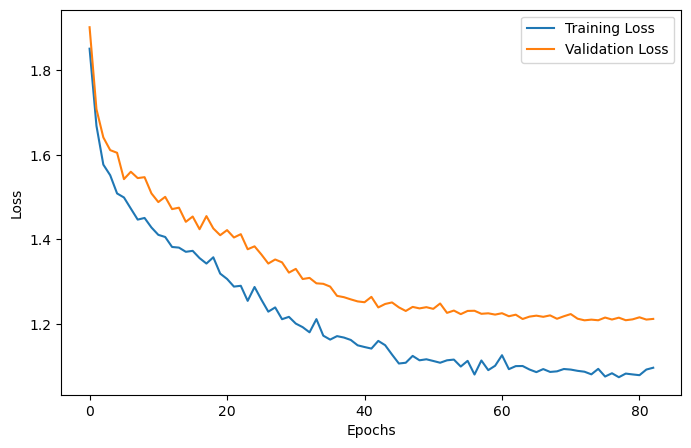

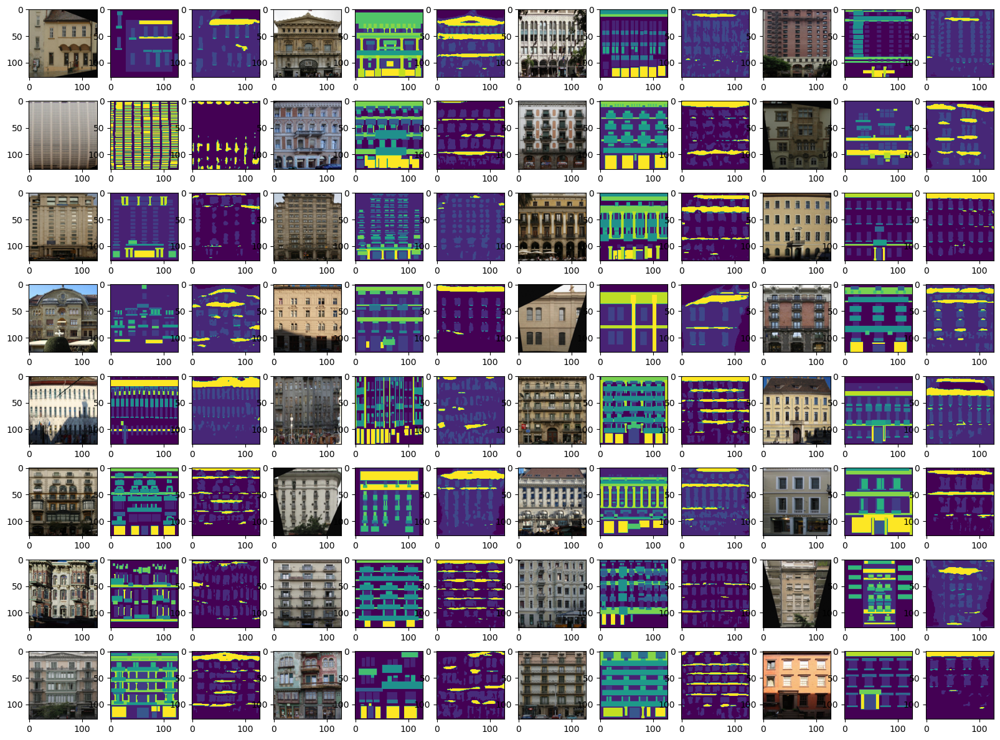

In [19]:
plot_training(history.history)
visualise(segmenter, image_list_test, mask_list_test)

As we can see, our output looks similar to what we've already had, and looking at our training and validation loss it seems that the model isn't overfitting as badly - so even if we are perhaps mixing features with different normalisation applied, the end result seems to have improved a little bit.

## Final Thoughts

This example has had a little look at semantic segmentation and U-Nets. These methods share a lot in common with autoencoders, but rather than having the same input and output, we're now mapping from one image domain to another. 

This is a very powerful way to perform tasks such as segmentation and other signal manipulation (or translation) tasks. A challenge that we can have with these tasks however is formulating a loss that generates a realistic output. We can easily enough formulate something for accuracy, but accuracy and realism are not always the same thing; for example some types of errors are more understandable than others and thus more easily glossed over when considering realism.

To improve upon these methods further, we can continue down the path that we've been going and make bigger and badder, more complicated networks with interesting loss terms. Or, we can look at GANs. Both are outside the scope of CAB420 sadly - but that doesn't mean you can't look into them for your project.
